In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/mask detection .zip" -d "/content/face-mask-detection/"

Archive:  /content/drive/MyDrive/mask detection .zip
  inflating: /content/face-mask-detection/annotations/maksssksksss0.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss1.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss10.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss100.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss101.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss102.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss103.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss104.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss105.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss106.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss107.xml  
  inflating: /content/face-mask-detection/annotations/maksssksksss108.xml  
  inflating: /content/face-mask-detectio

# **Data Review**

In [ ]:
# I import libraries that I will use.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# For preparing
import xml.etree.cElementTree as ET
import glob
import os
import json
import random
import shutil

from PIL import Image, ImageOps

In [ ]:
# Tagged data in XML format
with open('/content/face-mask-detection/annotations/maksssksksss0.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

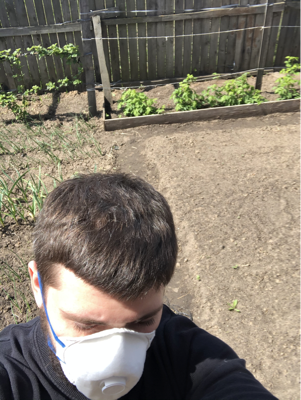

In [ ]:
# A visual from inside the dataset
Image.open("/content/face-mask-detection/images/maksssksksss101.png")

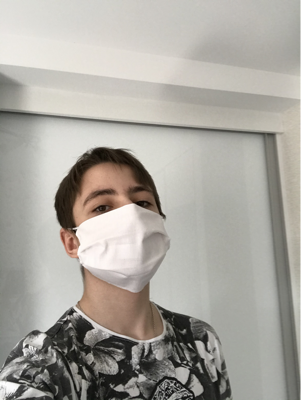

In [ ]:
# A visual from inside the dataset
Image.open("/content/face-mask-detection/images/maksssksksss17.png")

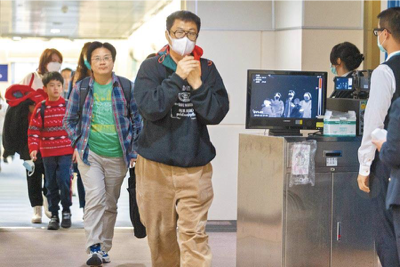

In [ ]:
# A visual from inside the dataset
Image.open("/content/face-mask-detection/images/maksssksksss179.png")

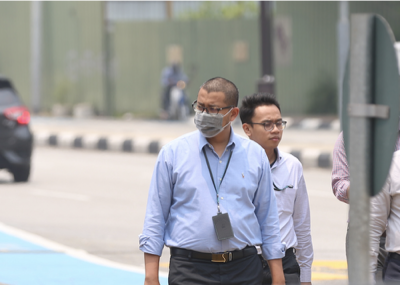

In [ ]:
# A visual from inside the dataset
Image.open("/content/face-mask-detection/images/maksssksksss38.png")

# **Prepare Data**


I prepared the dataset for the YoloV8. It converts the data in XML format into TXT format tag. I created the Traning tags for Yolo.

In [ ]:
# Converting XML format data to TXT format
def xml_to_yolo_bbox(bbox, w, h):
    # xmin, ymin, xmax, ymax
    x_center = ((bbox[2] + bbox[0]) / 2) / w
    y_center = ((bbox[3] + bbox[1]) / 2) / h

    width = (bbox[2] - bbox[0]) / w
    height = (bbox[3] - bbox[1]) / h

    return [x_center, y_center, width, height]

def yolo_to_xml_bbox(bbox, w, h):
    # x_center, y_center, width, height
    w_half_len = (bbox[2] * w) / 2
    h_half_len = (bbox[3] * h) / 2

    xmin = int((bbox[0] * w) - w_half_len)
    ymin = int((bbox[1] * h) - h_half_len)
    xmax = int((bbox[0] * w) + w_half_len)
    ymax = int((bbox[1] * h) + h_half_len)

    return [xmin, ymin, xmax, ymax]

classes = ["without_mask", "with_mask", "mask_weared_incorrect"]

input_dir = "/content/face-mask-detection/annotations"
output_dir = "/content/labels"
image_dir = "/content/face-mask-detection/images"


if not os.path.isdir(output_dir):
    os.mkdir(output_dir)

import glob

files = glob.glob(os.path.join(input_dir, "*.xml"))
for fil in files:
    basename = os.path.basename(fil)
    filename = os.path.splitext(basename)[0]
    if not os.path.exists(os.path.join(image_dir, f"{filename}.png")):
        print(f"{filename} image does not exist!")
        continue

    result = []

    # Parse the content of the xml file
    tree = ET.parse(fil)
    root = tree.getroot()
    width = int(root.find("size").find("width").text)
    height = int(root.find("size").find("height").text)

    for obj in root.findall("object"):
        label = obj.find("name").text

        # check for new classes and append to list
        if label not in classes:
            classes.append(label)
        index = classes.index(label)
        pil_bbox = [int(x.text) for x in obj.find("bndbox")]
        yolo_bbox = xml_to_yolo_bbox(pil_bbox, width, height)

        # convert data to string
        bbox_string = " ".join([str(x) for x in yolo_bbox])
        result.append(f"{index} {bbox_string}")

    if result:
        # generate a yolo format text file for each xml file
        with open(os.path.join(output_dir, f"{filename}.txt"), "w", encoding = "utf-8") as f:
            f.write("\n".join(result))
# generate the classes file as reference
with open("/content/classes.txt", "w", encoding = "utf-8") as f:
    f.write(json.dumps(classes))

Labels in the data set

In [ ]:
with open('/content/classes.txt') as f:
    contents = f.read()
    print(contents)


["without_mask", "with_mask", "mask_weared_incorrect"]


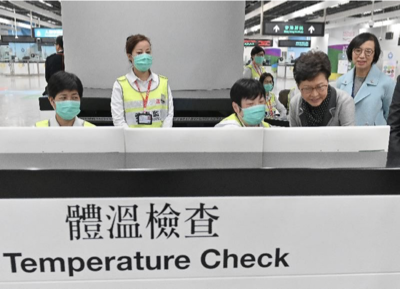

In [ ]:
# An image in the Data Set
Image.open("/content/face-mask-detection/images/maksssksksss119.png")

In [ ]:
# XML format tag of the image above.
with open('/content/face-mask-detection/annotations/maksssksksss100.xml') as f:
    contents = f.read()
    print(contents)


<annotation>
    <folder>images</folder>
    <filename>maksssksksss100.png</filename>
    <size>
        <width>400</width>
        <height>226</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>189</xmin>
            <ymin>30</ymin>
            <xmax>245</xmax>
            <ymax>88</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>387</xmin>
            <ymin>54</ymin>
            <xmax>400</xmax>
            <ymax>75</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncat

In [ ]:
# TXT version of the above label in XML format
with open('/content/labels/maksssksksss103.txt') as f:
    contents = f.read()
    print(contents)

1 0.17 0.2733333333333333 0.13 0.18666666666666668
1 0.53 0.25333333333333335 0.12 0.2
1 0.705 0.36333333333333334 0.105 0.14
1 0.96 0.43833333333333335 0.08 0.13


# Create Data For YoloV8

In this section, I created the training dataset for YoloV8 using the label data and image data I created.

In [ ]:
# Names and creation of files prepared for YoloV8
if os.path.isfile("/content/data/"):
    print("(There is folder!)")
else:
    os.mkdir("/content/data/")
    os.mkdir('/content/data/train')
    os.mkdir('/content/data/val')
    os.mkdir('/content/data/test')
    os.mkdir('/content/data/train/images')
    os.mkdir('/content/data/train/labels')
    os.mkdir('/content/data/test/images')
    os.mkdir('/content/data/test/labels')
    os.mkdir('/content/data/val/images')
    os.mkdir('/content/data/val/labels')

In [ ]:
# Listing the names of image data together
metarial = []

for i in os.listdir("/content/face-mask-detection/images"):
    srt = i[:-4]
    metarial.append(srt)

In [ ]:
# Initial data of Merarial list
metarial[0:10]

In [ ]:
# Data set creation function
def preparinbdata(main_txt_file, main_img_file, train_size, test_size, val_size):

    for i in range(0,train_size):

        source_txt = main_txt_file + "/" + metarial[i] + ".txt"
        source_img = main_img_file + "/" + metarial[i] + ".png"

        mstring = metarial[i]
        train_destination_txt = "/content/data/train/labels" + "/" + metarial[i] + ".txt"
        train_destination_png = "/content/data/train/images" + "/" + metarial[i] + ".png"

        shutil.copy(source_txt, train_destination_txt)
        shutil.copy(source_img, train_destination_png)

        #metarial.remove(file_name[:-4])


    for l in range(train_size , train_size + test_size):

        source_txt = main_txt_file + "/" + metarial[l] + ".txt"
        source_img = main_img_file + "/" + metarial[l] + ".png"

        mstring = metarial[l]
        test_destination_txt = "/content/data/test/labels" + "/" + metarial[l] + ".txt"
        test_destination_png = "/content/data/test/images" + "/" + metarial[l] + ".png"

        shutil.copy(source_txt, test_destination_txt)
        shutil.copy(source_img, test_destination_png)

        #metarial.remove(file_name[:-4])


    for n in range(train_size + test_size , train_size + test_size + val_size):

        source_txt = main_txt_file + "/" + metarial[n] + ".txt"
        source_img = main_img_file + "/" + metarial[n] + ".png"

        mstring = metarial[n]
        val_destination_txt = "/content/data/val/labels" + "/" + metarial[n] + ".txt"
        val_destination_png = "/content/data/val/images" + "/" + metarial[n] + ".png"

        shutil.copy(source_txt, val_destination_txt)
        shutil.copy(source_img, val_destination_png)

        #metarial.remove(file_name[:-4])

In [ ]:
# I'm streaming data
preparinbdata("/content/labels", "/content/face-mask-detection/images", 603, 150, 100)

In [ ]:
# configure .yaml file to guide the model for training
%cd /content/data

yaml_text = """train: /content/data/train/images
val: /content/data/val/images

nc: 3
names: ["without_mask", "with_mask", "mask_weared_incorrect"]"""

with open("/content/data/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat data/data.yaml

/content/data
cat: data/data.yaml: No such file or directory


# **YoloV8**

This file consists of downloading the YoloV8 library, training and detection parts.

In [ ]:
# We install the 'ultralytics' library to use the YoloV8 library
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.199 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU (AMD EPYC 7B12)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.2/107.7 GB disk)


# Training

 I will perform the training using the data set I prepared in this section. I will do a 50-step training. If you want, you can increase this epochs



In [ ]:
# /content/data
if os.path.isfile("/content/Result/"):
    print("(There is folder!)")
else:
    os.mkdir("/content/Result/")

%cd /content/Result/

#(I am doing YoloV8 model 50 step training)
# data = "Path to the file with .yaml extension"
# epochs = How many steps will you train?
# imagsz = This is size of image at the training data
!yolo train model=yolov8n.pt data=/content/data/data.yaml epochs=50 imgsz=640

/content/Result
100% 6.23M/6.23M [00:00<00:00, 70.0MB/s]
Ultralytics YOLOv8.0.199 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU (AMD EPYC 7B12)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, box

In [ ]:
# The result of my training
Image.open("/content/Result/runs/detect/train/results.png")

# **Detection**

Tests are performed on the images in the test data set using the Best.pt file resulting from the training. At the same time, I will perform tests with real-life data.

In [ ]:
# The detection process we performed on the test dataset
# model = 'best.pt' is the step with the best score of the model I trained.
# soruce = Image or image folder of detection operations
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/data/test/images'

In [ ]:
# Detection result- 1
Image.open('/content/Result/runs/detect/predict/maksssksksss1.png')

In [ ]:
# Detection result- 2
Image.open('/content/Result/runs/detect/predict/maksssksksss232.png')

In [ ]:
# Detection result - 3
Image.open('/content/Result/runs/detect/predict/maksssksksss677.png')

As you can see in test result 2, our model made an incorrect determination, but the accuracy rate is 0.38. If you want, you can increase the accuracy values at the detection point.


Below is a detection process performed on real world data. This real-world of data is not in my dataset. because of this, I said "This data is real-world data".



In [ ]:
# Download the real-world data
%cd /content
!wget "https://onecms-res.cloudinary.com/image/upload/s--XV7DHKzY--/c_fill,g_auto,h_468,w_830/f_auto,q_auto/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"

# I check my upload and then change the name of the image I downloaded(Yüklememi konrol ediyorum ve artından indirdiğim resimin ismini değiştiriyorum)
if os.path.isfile("/content/people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A"):
  os.rename("people-wearing-mask-at-orchard-road-singapore-feb-3--49-.jpg?itok=GdDk1T6A", "image.jpg")

In [ ]:
# Detection on real-world
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image.jpg'

In [ ]:
# Result of detection
Image.open('/content/Result/runs/detect/predict2/image.jpg')

In [ ]:
# Download the real-world data
%cd /content
!wget "https://cloudfront-us-east-2.images.arcpublishing.com/reuters/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"

In [ ]:
# I check my upload and then change the name of the image I downloaded
if os.path.isfile("/content/KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg"):
  os.rename("KPYTVDNVAZIOFDEB2JJN4BHYFU.jpg", "image2.jpg")

In [ ]:
# Detection on real-world
%cd /content/Result
!yolo predict model=/content/Result/runs/detect/train/weights/best.pt source='/content/image2.jpg'

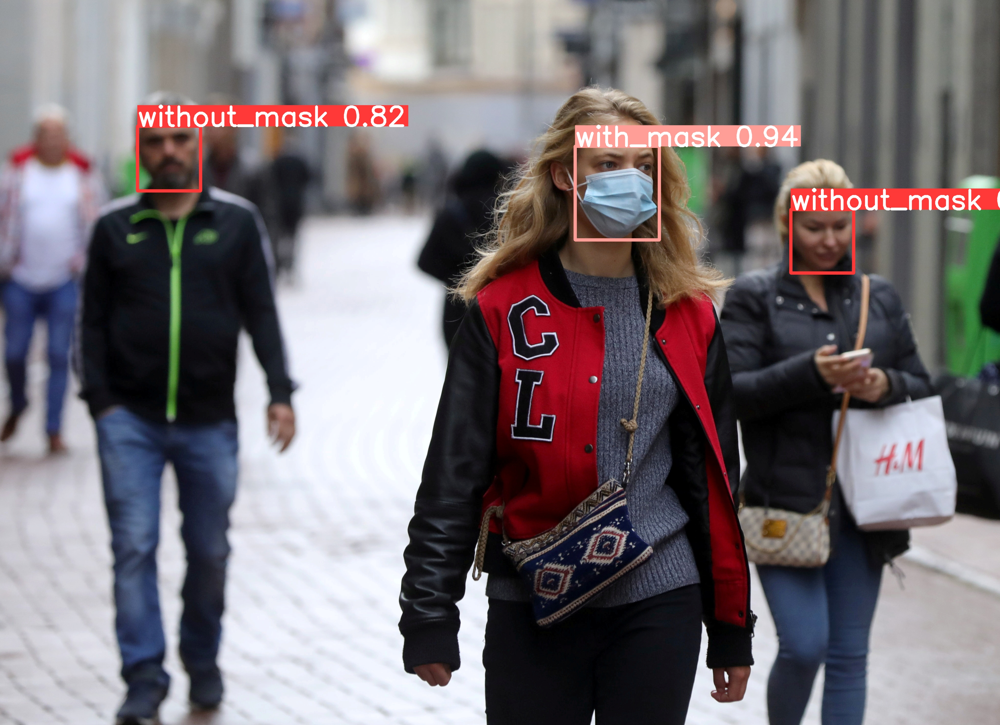

In [ ]:
# Result of detection
Image.open('/content/Result/runs/detect/predict3/image2.jpg')

# CONCLUSION

Thank you for reviewing my project this far. I hope this has been a project for you that sheds light on your path and expands your horizons. About to be selected for new projects!
